Debido al hecho de que GitHub realiza una representación estática de los cuadernos y no incluye el HTML/JavaScript incrustado que forma un gráfico de trama, y teniendo en cuenta que para presentar la información de una forma más amena e interactiva se hizo uso de la librería Plotly de Python la cual crea este tipo de gráficas combinadas con HTML, no es posible verlas directamente en este Notebook, por lo que lo invitamos a observar este mismo Notebook de forma renderizada en el link de [acá](https://colab.research.google.com/drive/1uwoA4n3wOl78dCpV1AUQycdQWNr2Ou_C?usp=sharing) el cual es un Gooogle Colab con el código que le permitirá interactuar con el mismo

# 1.  Evaluaciones Agropecuarias Municipales – EVA. 2019 - 2023. Base Agrícola

  Este conjunto de datos, obtenido de los disponibles para el concurso, brinda información sobre "el área, la producción y el rendimiento de la actividad agropecuaria municipal". En total se presenta la información para 1103 municipios, incluyendo cerca de 200 productos de la canasta agropecuaria. (Información tomada de la descripción del conjunto de datos)

Primero importamos las librerías necesarias para leer y realizar las visualizaciones pertinentes

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.io as pio
pio.renderers.default = "plotly_mimetype"

In [2]:
df = pd.read_csv("Evaluaciones_Agropecuarias_Municipales_2019_2023.csv")

In [4]:
df.head()

,Código Dane departamento,Departamento,Código Dane municipio,Municipio,Grupo cultivo,Subgrupo,Cultivo,Desagregación cultivo,Año,Periodo,Área sembrada,Área cosechada,Producción,Rendimiento,Ciclo del cultivo,Estado físico del cultivo,Código del cultivo,Nombre científico del cultivo
0,5,Antioquia,5002,Abejorral,Frutales,Demás frutales,Aguacate,Aguacate demás variedades,2019,2019,807.0,506.0,9614.0,19.0,Permanente,En fresco,2040299,Persea americana
1,5,Antioquia,5002,Abejorral,Frutales,Demás frutales,Aguacate,Aguacate Hass,2020,2020,857.0,707.0,13433.0,19.0,Permanente,En fresco,2040201,Persea americana
2,5,Antioquia,5002,Abejorral,Frutales,Demás frutales,Aguacate,Aguacate Hass,2021,2021,1007.0,707.0,13433.0,19.0,Permanente,En fresco,2040201,Persea americana
3,5,Antioquia,5002,Abejorral,Frutales,Demás frutales,Aguacate,Aguacate Hass,2022,2022,4307.0,3857.0,73283.0,19.0,Permanente,En fresco,2040201,Persea americana
4,5,Antioquia,5002,Abejorral,Frutales,Demás frutales,Aguacate,Aguacate Hass,2023,2023,3807.0,1007.0,19133.0,19.0,Permanente,En fresco,2040201,Persea americana


In [5]:
df = df.drop(columns=['Código Dane departamento', 'Código Dane municipio','Código del cultivo'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115572 entries, 0 to 115571
Data columns (total 15 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Departamento                   115572 non-null  object 
 1   Municipio                      115572 non-null  object 
 2   Grupo cultivo                  115572 non-null  object 
 3   Subgrupo                       115572 non-null  object 
 4   Cultivo                        115572 non-null  object 
 5   Desagregación cultivo          115572 non-null  object 
 6   Año                            115572 non-null  int64  
 7   Periodo                        115572 non-null  object 
 8   Área sembrada                  115572 non-null  float64
 9   Área cosechada                 115572 non-null  float64
 10  Producción                     115572 non-null  float64
 11  Rendimiento                    115572 non-null  float64
 12  Ciclo del cultivo             

In [7]:
df.describe()

,Año,Área sembrada,Área cosechada,Producción,Rendimiento
count,115572.000000,115572.000000,115572.000000,1.155720e+05,115572.000000
mean,2021.106107,233.692232,214.304479,3.214476e+03,10.692571
std,1.399749,1165.780022,1108.192961,4.881239e+04,15.886380
min,2019.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,2020.000000,6.000000,5.000000,2.299500e+01,1.900000
50%,2021.000000,20.000000,18.105000,1.080000e+02,6.000000
75%,2022.000000,97.000000,85.000000,5.750000e+02,13.000000
max,2023.000000,60000.000000,61000.000000,4.776340e+06,640.000000


Para la siguiente gráfica vemos el porcentaje de producción total separado por departamento

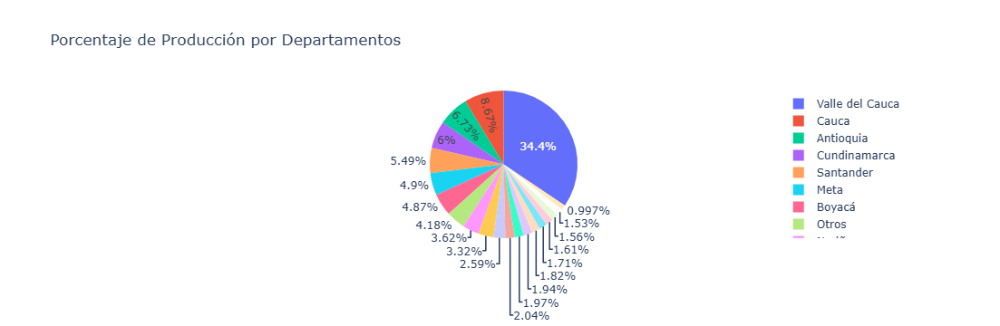

In [8]:
# Agrupar la producción total por departamento
produccion_por_departamento = df.groupby('Departamento')['Producción'].sum().reset_index()

# Calcular el porcentaje de producción para cada departamento
total_produccion = produccion_por_departamento['Producción'].sum()
produccion_por_departamento['Porcentaje'] = (produccion_por_departamento['Producción'] / total_produccion) * 100

# Filtrar los departamentos con producción significativa (>2%) y agrupar el resto como "Otros"
umbral = 0.9  # Define el umbral mínimo para considerar un departamento como significativo
departamentos_significativos = produccion_por_departamento[produccion_por_departamento['Porcentaje'] > umbral]
departamentos_no_significativos = produccion_por_departamento[produccion_por_departamento['Porcentaje'] <= umbral]

# Crear la categoría "Otros"
otros = pd.DataFrame({
    'Departamento': ['Otros'],
    'Producción': [departamentos_no_significativos['Producción'].sum()],
    'Porcentaje': [departamentos_no_significativos['Porcentaje'].sum()]
})

# Combinar los departamentos significativos con la categoría "Otros"
produccion_final = pd.concat([departamentos_significativos, otros])

# Crear el gráfico circular
fig = px.pie(produccion_final, names='Departamento', values='Producción', title='Porcentaje de Producción por Departamentos')

# Mostrar el gráfico interactivo
fig.show()


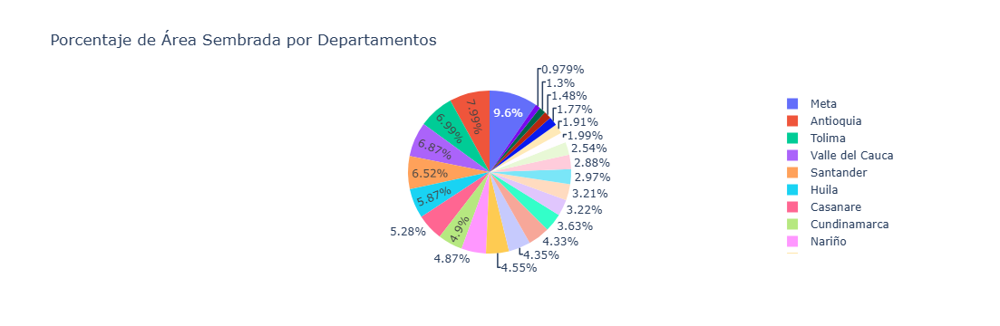

In [9]:
# Agrupar el área sembrada total por departamento
area_por_departamento = df.groupby('Departamento')['Área sembrada'].sum().reset_index()

# Calcular el porcentaje de área sembrada para cada departamento
total_area = area_por_departamento['Área sembrada'].sum()
area_por_departamento['Porcentaje'] = (area_por_departamento['Área sembrada'] / total_area) * 100

# Filtrar los departamentos con área sembrada significativa (>2%) y agrupar el resto como "Otros"
umbral = 0.9  # Define el umbral mínimo para considerar un departamento como significativo
departamentos_significativos = area_por_departamento[area_por_departamento['Porcentaje'] > umbral]
departamentos_no_significativos = area_por_departamento[area_por_departamento['Porcentaje'] <= umbral]

# Crear la categoría "Otros"
otros = pd.DataFrame({
    'Departamento': ['Otros'],
    'Área sembrada': [departamentos_no_significativos['Área sembrada'].sum()],
    'Porcentaje': [departamentos_no_significativos['Porcentaje'].sum()]
})

# Combinar los departamentos significativos con la categoría "Otros"
area_final = pd.concat([departamentos_significativos, otros])

# Crear el gráfico circular
fig = px.pie(area_final, names='Departamento', values='Área sembrada', title='Porcentaje de Área Sembrada por Departamentos')

# Mostrar el gráfico interactivo
fig.show()

In [10]:
produccion_por_departamento = df.groupby('Departamento')['Producción'].sum().reset_index()
produccion_por_departamento = produccion_por_departamento.sort_values(by='Producción', ascending=False).head(10)
top_departamentos = produccion_por_departamento['Departamento'].tolist()

In [11]:
top_departamentos

['Valle del Cauca',
 'Cauca',
 'Antioquia',
 'Cundinamarca',
 'Santander',
 'Meta',
 'Boyacá',
 'Nariño',
 'Tolima',
 'Huila']

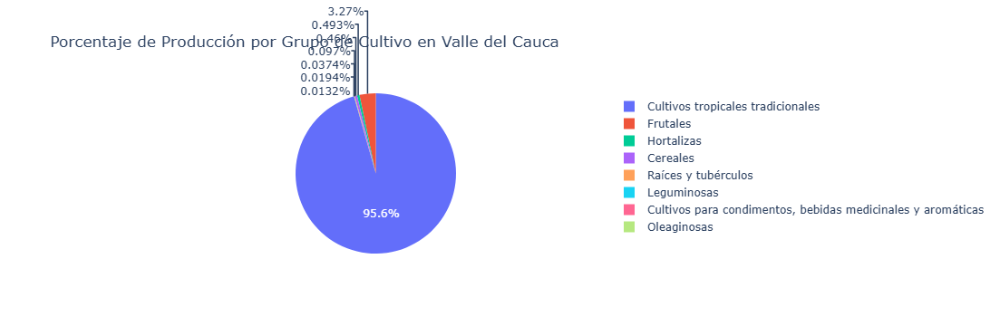

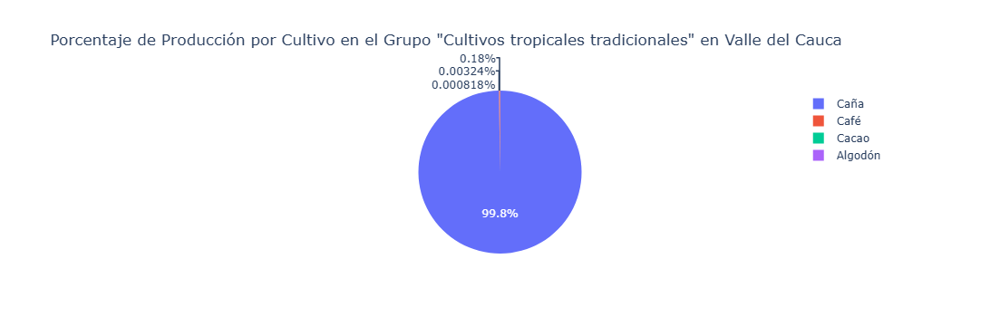

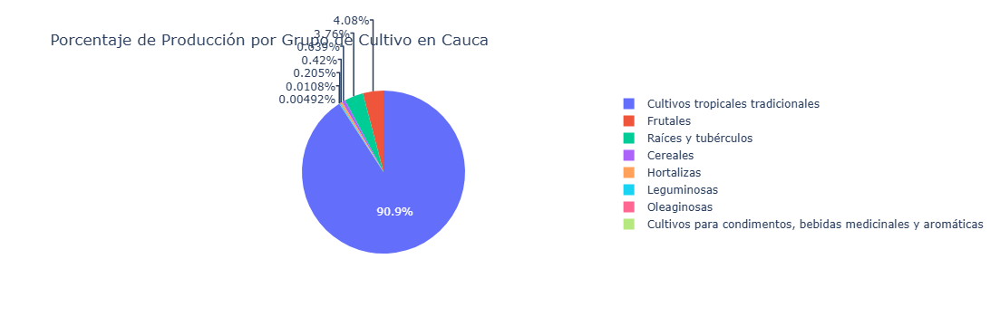

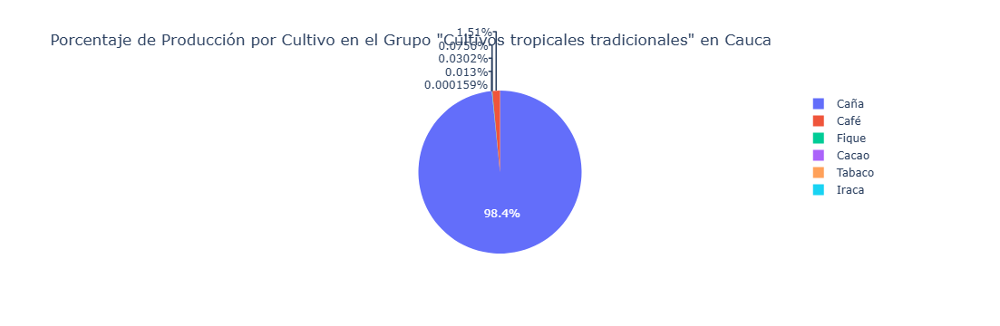

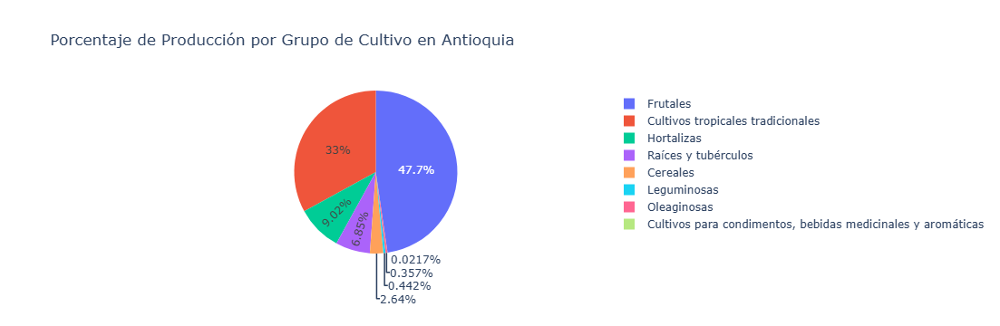

...

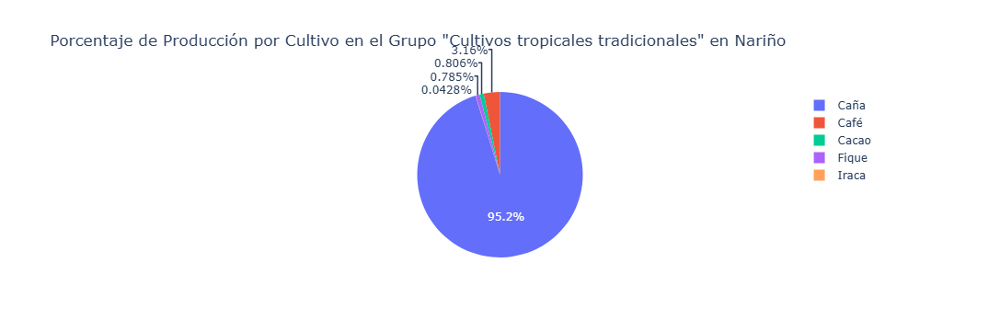

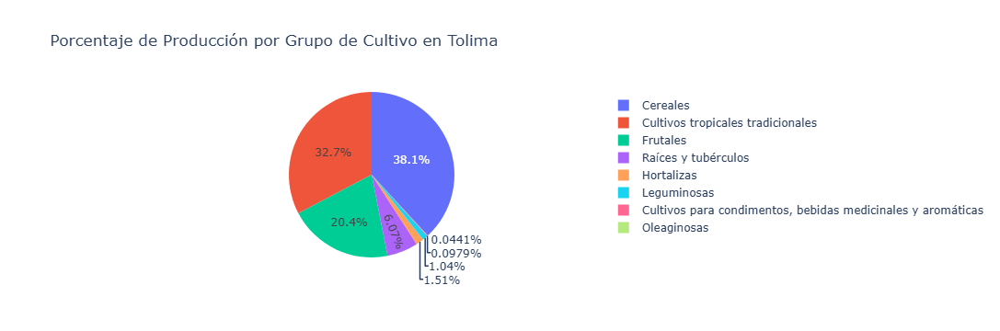

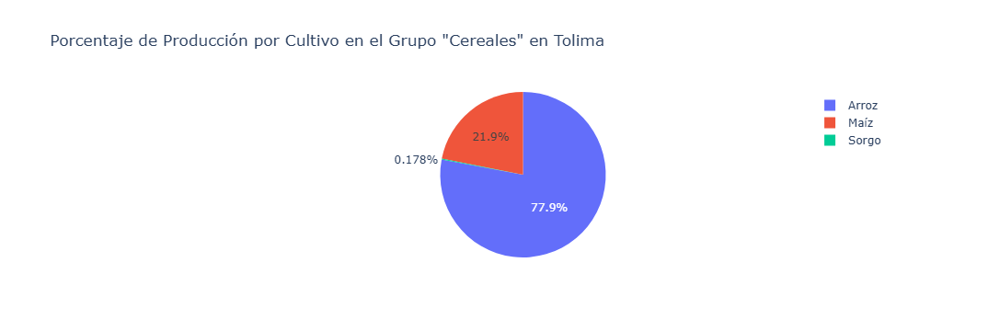

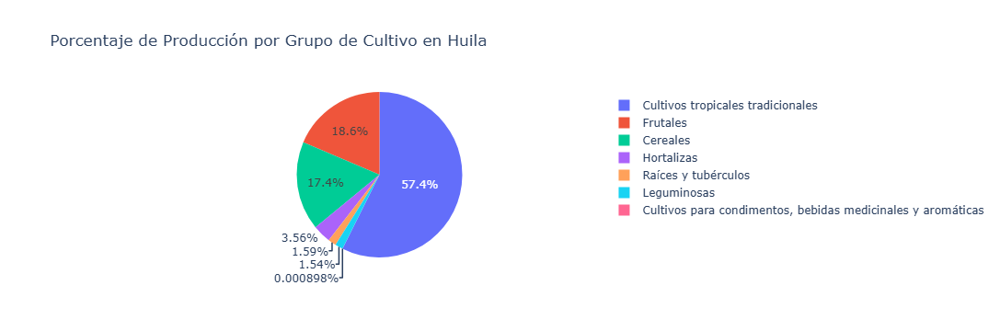

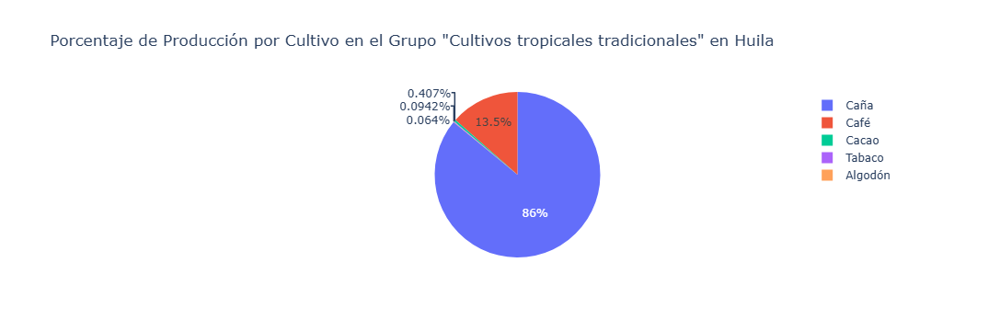

In [12]:
# Función para crear gráfico circular de porcentaje de producción por grupo de cultivo en un departamento
def graficar_por_grupo(df, departamento):
    # Filtrar los datos para el departamento especificado
    depto_data = df[df['Departamento'] == departamento]

    # Agrupar por Grupo cultivo y sumar la producción
    produccion_por_grupo = depto_data.groupby('Grupo cultivo')['Producción'].sum().reset_index()

    # Calcular el porcentaje de producción para cada grupo de cultivo
    total_produccion_depto = produccion_por_grupo['Producción'].sum()
    produccion_por_grupo['Porcentaje'] = (produccion_por_grupo['Producción'] / total_produccion_depto) * 100

    # Crear el gráfico circular con Plotly
    fig = px.pie(produccion_por_grupo, names='Grupo cultivo', values='Producción',
                 title=f'Porcentaje de Producción por Grupo de Cultivo en {departamento}')

    # Ajustar el margen superior para evitar superposición con el título
    fig.update_layout(margin=dict(t=100))

    fig.show()

    return produccion_por_grupo  # Retorna el DataFrame para utilizar el grupo con mayor producción

# Función para crear gráfico circular de porcentaje de producción por cultivo en un grupo de cultivo específico
def graficar_por_cultivo(df, departamento, grupo_mayor):
    # Filtrar los datos para el grupo de cultivo con mayor producción
    depto_grupo_data = df[(df['Departamento'] == departamento) &
                          (df['Grupo cultivo'] == grupo_mayor)]

    # Agrupar por Cultivo y sumar la producción
    produccion_por_cultivo = depto_grupo_data.groupby('Cultivo')['Producción'].sum().reset_index()

    # Calcular el porcentaje de producción para cada cultivo
    total_produccion_cultivo = produccion_por_cultivo['Producción'].sum()
    produccion_por_cultivo['Porcentaje'] = (produccion_por_cultivo['Producción'] / total_produccion_cultivo) * 100

    # Crear el gráfico circular con Plotly
    fig = px.pie(produccion_por_cultivo, names='Cultivo', values='Producción',
                 title=f'Porcentaje de Producción por Cultivo en el Grupo "{grupo_mayor}" en {departamento}')

    # Ajustar el margen superior para evitar superposición con el título
    fig.update_layout(margin=dict(t=100))

    fig.show()

# Lista de departamentos a analizar

# Loop para generar gráficos para cada departamento
for depto in top_departamentos:
    # Primer gráfico: producción por grupo de cultivo
    produccion_grupo_df = graficar_por_grupo(df, depto)

    # Encontrar el grupo de cultivo con mayor producción en el departamento
    grupo_mayor = produccion_grupo_df.loc[produccion_grupo_df['Producción'].idxmax(), 'Grupo cultivo']

    # Segundo gráfico: producción por cultivo dentro del grupo con mayor producción
    graficar_por_cultivo(df, depto, grupo_mayor)


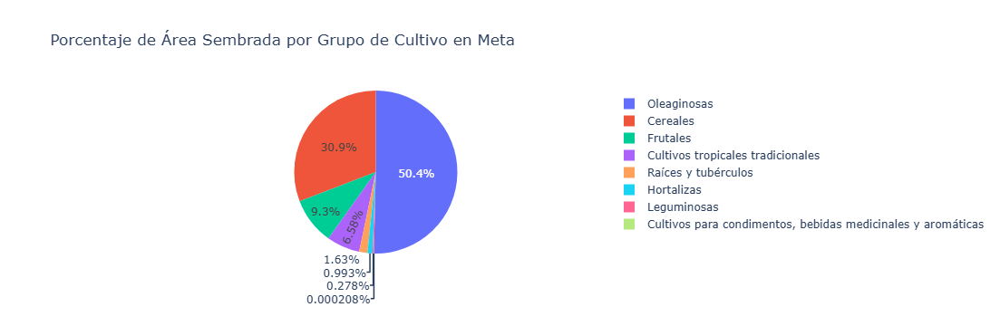

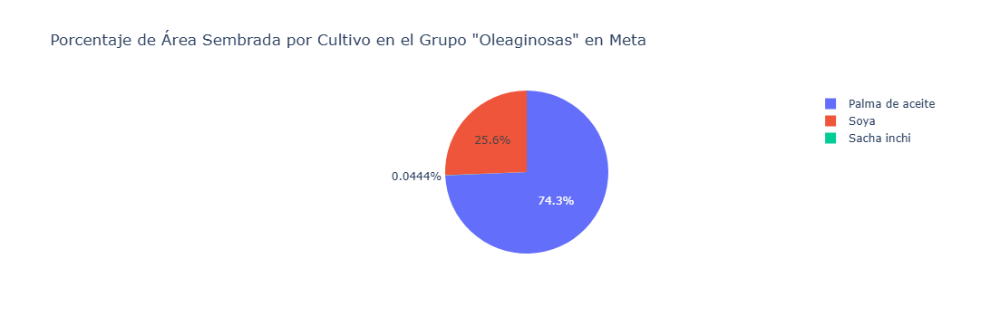

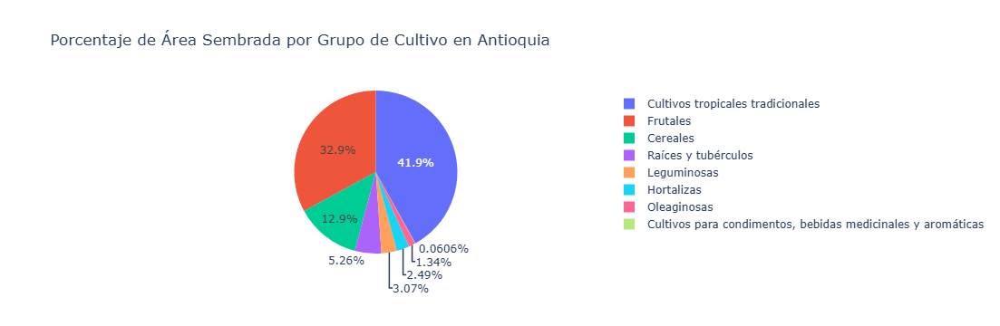

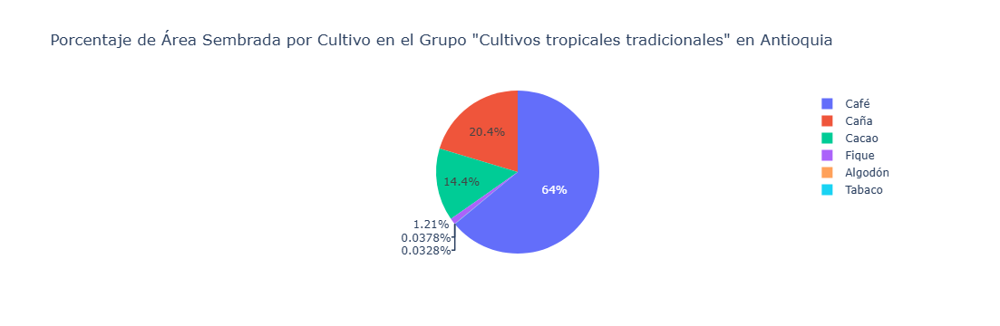

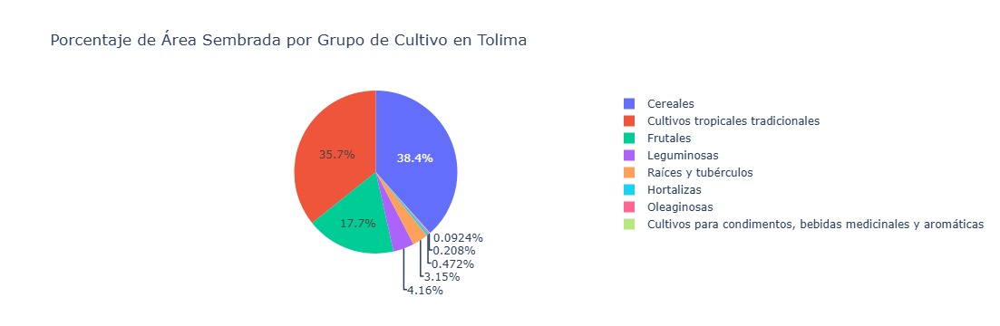

...

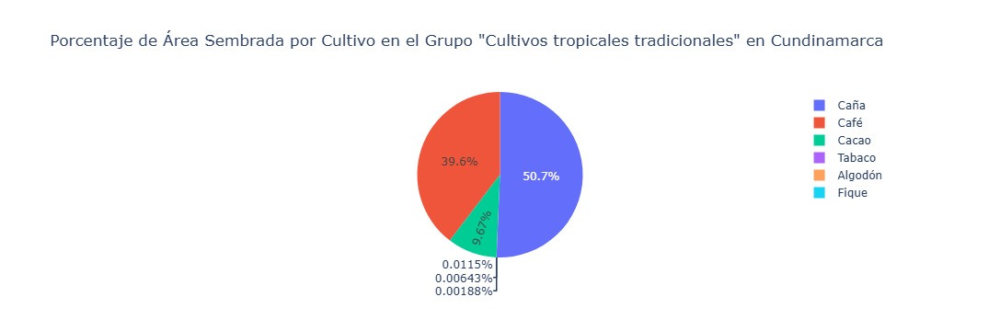

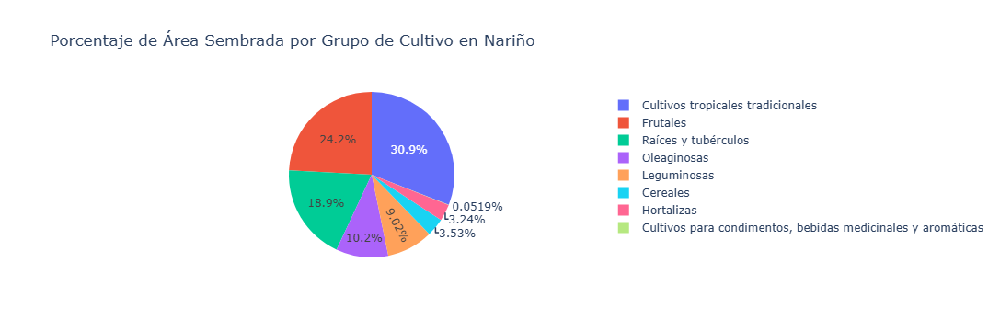

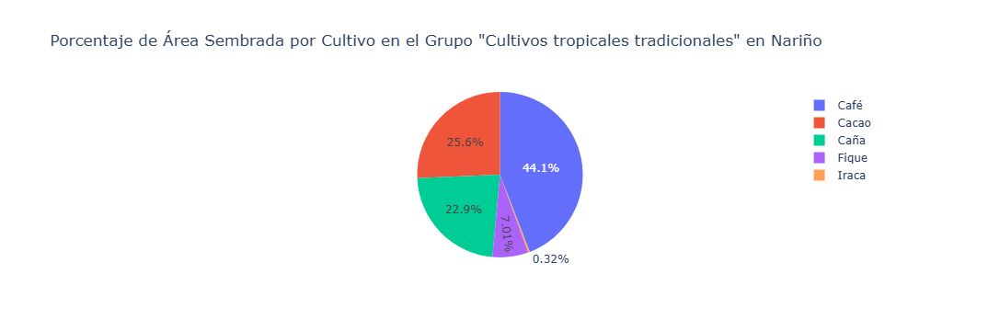

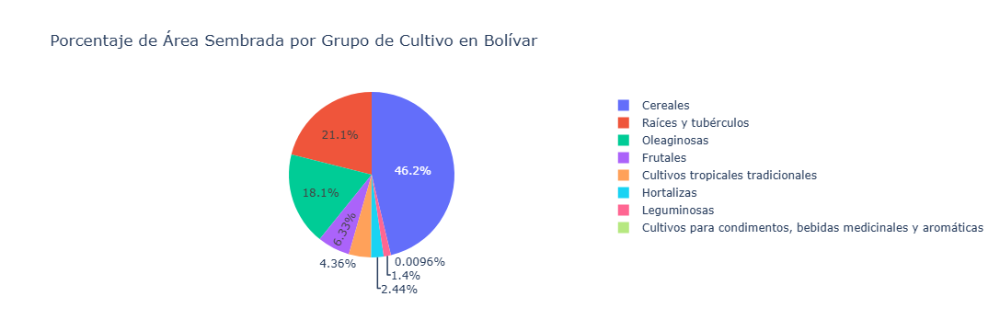

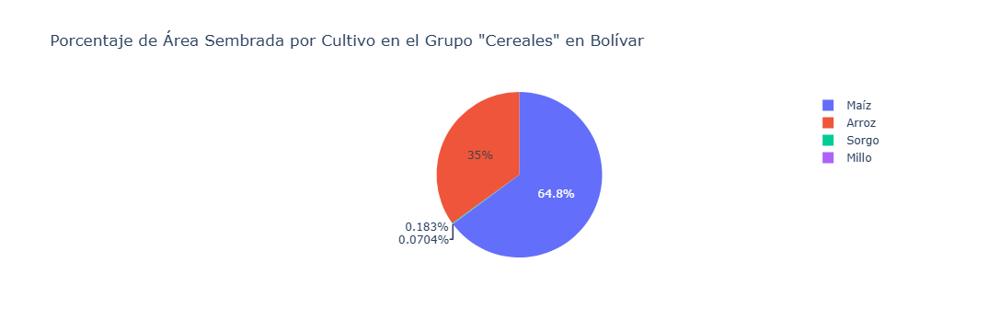

In [13]:
# Agrupar el área sembrada total por departamento
area_por_departamento = df.groupby('Departamento')['Área sembrada'].sum().reset_index()

# Ordenar por área sembrada de mayor a menor y seleccionar los 10 departamentos principales
area_por_departamento = area_por_departamento.sort_values(by='Área sembrada', ascending=False).head(10)
top_departamentos = area_por_departamento['Departamento'].tolist()

# Función para crear gráfico circular de porcentaje de área sembrada por grupo de cultivo en un departamento
def graficar_por_grupo(df, departamento):
    # Filtrar los datos para el departamento especificado
    depto_data = df[df['Departamento'] == departamento]

    # Agrupar por Grupo cultivo y sumar el área sembrada
    area_por_grupo = depto_data.groupby('Grupo cultivo')['Área sembrada'].sum().reset_index()

    # Calcular el porcentaje de área sembrada para cada grupo de cultivo
    total_area_depto = area_por_grupo['Área sembrada'].sum()
    area_por_grupo['Porcentaje'] = (area_por_grupo['Área sembrada'] / total_area_depto) * 100

    # Crear el gráfico circular con Plotly
    fig = px.pie(area_por_grupo, names='Grupo cultivo', values='Área sembrada',
                 title=f'Porcentaje de Área Sembrada por Grupo de Cultivo en {departamento}')

    # Ajustar el margen superior para evitar superposición con el título
    fig.update_layout(margin=dict(t=100))

    fig.show()

    return area_por_grupo  # Retorna el DataFrame para utilizar el grupo con mayor área sembrada

# Función para crear gráfico circular de porcentaje de área sembrada por cultivo en un grupo de cultivo específico
def graficar_por_cultivo(df, departamento, grupo_mayor):
    # Filtrar los datos para el grupo de cultivo con mayor área sembrada
    depto_grupo_data = df[(df['Departamento'] == departamento) &
                          (df['Grupo cultivo'] == grupo_mayor)]

    # Agrupar por Cultivo y sumar el área sembrada
    area_por_cultivo = depto_grupo_data.groupby('Cultivo')['Área sembrada'].sum().reset_index()

    # Calcular el porcentaje de área sembrada para cada cultivo
    total_area_cultivo = area_por_cultivo['Área sembrada'].sum()
    area_por_cultivo['Porcentaje'] = (area_por_cultivo['Área sembrada'] / total_area_cultivo) * 100

    # Crear el gráfico circular con Plotly
    fig = px.pie(area_por_cultivo, names='Cultivo', values='Área sembrada',
                 title=f'Porcentaje de Área Sembrada por Cultivo en el Grupo "{grupo_mayor}" en {departamento}')

    # Ajustar el margen superior para evitar superposición con el título
    fig.update_layout(margin=dict(t=100))

    fig.show()

# Lista de departamentos a analizar

# Loop para generar gráficos para cada departamento
for depto in top_departamentos:
    # Primer gráfico: área sembrada por grupo de cultivo
    area_grupo_df = graficar_por_grupo(df, depto)

    # Encontrar el grupo de cultivo con mayor área sembrada en el departamento
    grupo_mayor = area_grupo_df.loc[area_grupo_df['Área sembrada'].idxmax(), 'Grupo cultivo']

    # Segundo gráfico: área sembrada por cultivo dentro del grupo con mayor área sembrada
    graficar_por_cultivo(df, depto, grupo_mayor)


También es importante conocer la proporción de la producción por cada grupo de cultivo en todo el país

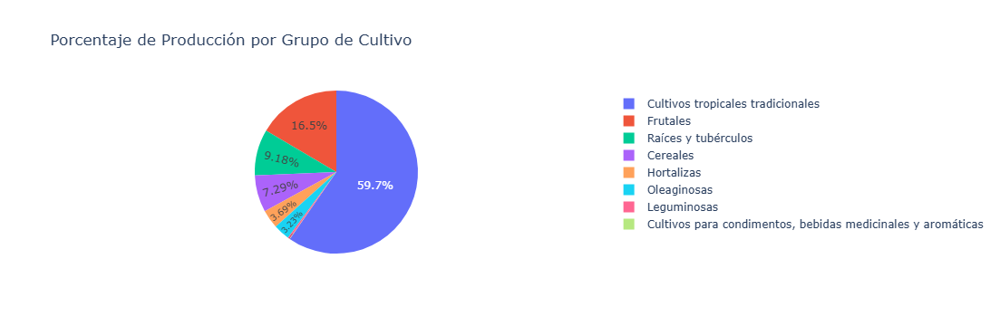

In [14]:
# Agrupar los datos por Grupo cultivo y sumar la producción
produccion_por_grupo = df.groupby('Grupo cultivo')['Producción'].sum().reset_index()

# Crear el gráfico circular
fig = px.pie(
    produccion_por_grupo,
    names='Grupo cultivo',
    values='Producción',
    title='Porcentaje de Producción por Grupo de Cultivo',
)

# Personalizar el gráfico para mostrar solo los porcentajes más altos
fig.update_traces(
    textposition='inside',
    textinfo='percent'  # Muestra solo los porcentajes
)

# Mostrar el gráfico
fig.show()


Es posible observar que hay una gran concentración de la producción en el departamento del Valle del Cauca, por lo que será pertinente conocer más sobre la información que se tiene de este departamento.

A continuación se observa la proporción de los grupos de cultivos para el Valle del Cauca

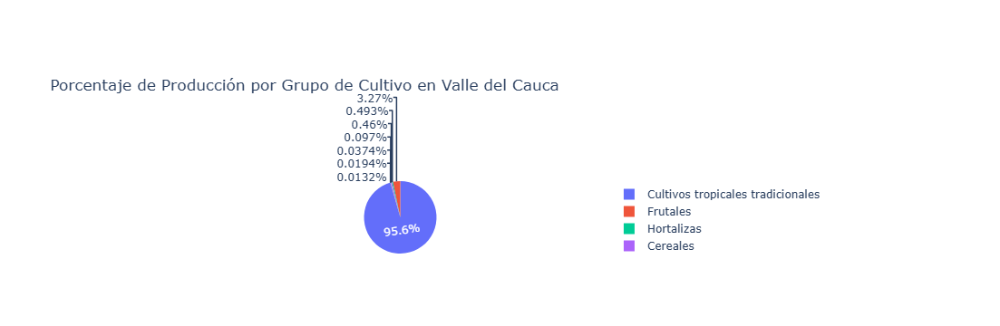

In [15]:
# Filtrar los datos para el departamento de Valle del Cauca
valle_data = df[df['Departamento'] == 'Valle del Cauca']

# Agrupar por Grupo cultivo y sumar la producción
produccion_por_grupo = valle_data.groupby('Grupo cultivo')['Producción'].sum().reset_index()

# Calcular el porcentaje de producción para cada grupo de cultivo en Valle del Cauca
total_produccion_valle = produccion_por_grupo['Producción'].sum()
produccion_por_grupo['Porcentaje'] = (produccion_por_grupo['Producción'] / total_produccion_valle) * 100

# Crear el gráfico circular con Plotly
fig = px.pie(produccion_por_grupo, names='Grupo cultivo', values='Producción',
             title='Porcentaje de Producción por Grupo de Cultivo en Valle del Cauca')

# Ajustar el margen superior para evitar que los porcentajes se superpongan con el título
fig.update_layout(margin=dict(t=200))  # Aumentar el margen superior (t=top)

# Mostrar el gráfico interactivo
fig.show()


In [16]:
cultivos_valle = valle_data[(valle_data['Grupo cultivo']=='Cultivos tropicales tradicionales')]
cultivos_valle['Cultivo'].unique()

array(['Cacao', 'Café', 'Algodón', 'Caña'], dtype=object)

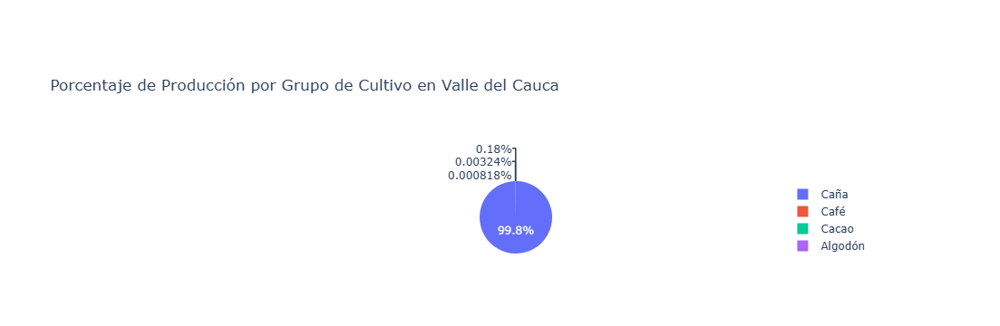

In [17]:
# Agrupar por Grupo cultivo y sumar la producción
produccion_por_cultivo = cultivos_valle.groupby('Cultivo')['Producción'].sum().reset_index()

# Calcular el porcentaje de producción para cada grupo de cultivo en Valle del Cauca
total_produccion_cultivos_valle = produccion_por_cultivo['Producción'].sum()
produccion_por_cultivo['Porcentaje'] = (produccion_por_cultivo['Producción'] / total_produccion_cultivos_valle) * 100

# Crear el gráfico circular con Plotly
fig = px.pie(produccion_por_cultivo, names='Cultivo', values='Producción',
             title='Porcentaje de Producción por Grupo de Cultivo en Valle del Cauca')

# Ajustar el margen superior para evitar que los porcentajes se superpongan con el título
fig.update_layout(margin=dict(t=200))  # Aumentar el margen superior (t=top)

# Mostrar el gráfico interactivo
fig.show()


Lo que sucede con la Caña es que se obtiene una muy alta producción por área cosechada, lo que genera un desbalance en comparación con el resto de los cultivos

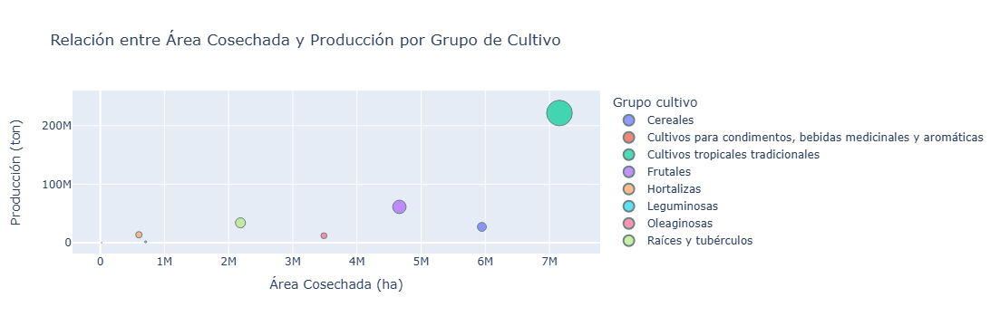

In [18]:
# Agrupar los datos por grupo de cultivo, sumando área y producción
cultivo_data = df.groupby('Grupo cultivo').agg(
    {'Área cosechada': 'sum', 'Producción': 'sum'}
).reset_index()

# Crear el scatter plot
fig = px.scatter(
    cultivo_data,
    x='Área cosechada',
    y='Producción',
    color='Grupo cultivo',
    size='Producción',  # Ajusta el tamaño de las burbujas en función de la producción total
    title="Relación entre Área Cosechada y Producción por Grupo de Cultivo",
    labels={'Área cosechada': 'Área Cosechada (ha)', 'Producción': 'Producción (ton)'}
)

# Agregar línea de tendencia (opcional)
fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(showlegend=True)

# Mostrar el gráfico
fig.show()


Esta gráfica interactiva de dispersión por área cosechada vs producción puede dar una idea de la relación posiblemente lineal que hay entre estas dos variables, sin embargo, es posible observar que esta relación tiene proporcionalidades variadas, dependiendo del grupo de cultivo, lo que puede dar ideas de un posible modelo de clustering para identificar las necesidades específicas de cada grupo.

In [19]:
max_row = df.loc[df['Producción'].idxmax()]

# Display the entire row
max_row

Departamento                                       Valle del Cauca
Municipio                                                  Palmira
Grupo cultivo                    Cultivos tropicales tradicionales
Subgrupo                         Cultivos tropicales tradicionales
Cultivo                                                       Caña
Desagregación cultivo                               Caña de azúcar
Año                                                           2021
Periodo                                                       2021
Área sembrada                                              33900.0
Área cosechada                                             33900.0
Producción                                               4776340.5
Rendimiento                                                  140.9
Ciclo del cultivo                                       Permanente
Estado físico del cultivo                             Caña o verde
Nombre científico del cultivo                Saccharum officin

De acuerdo con https://www.asocana.org/publico/info.aspx?Cid=215

nos da la producción de caña para 2022, por lo que vamos a comparar con los datos.

In [20]:
# Filtramos el DataFrame para obtener los datos de cultivo de caña en el Valle del Cauca para 2022
filtered_df = df[(df['Departamento'] == 'Valle del Cauca') &
                 (df['Cultivo'] == 'Caña') &
                 (df['Año'] == 2022)]

# Sum the values in the 'Producción' column
total_produccion = filtered_df['Producción'].sum()

print(f"\nTotal Producción: {total_produccion}")


Total Producción: 24604639.67


Lo cual es acorde con los valores registrados

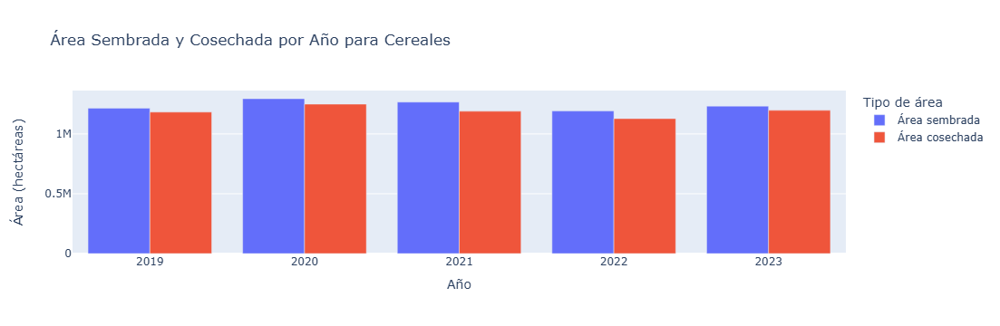

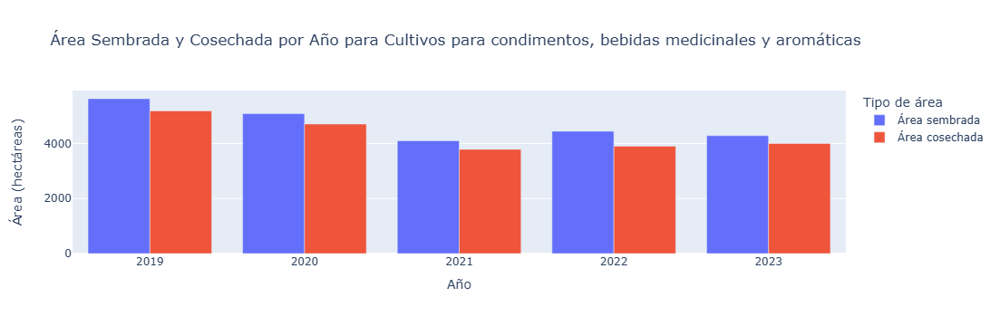

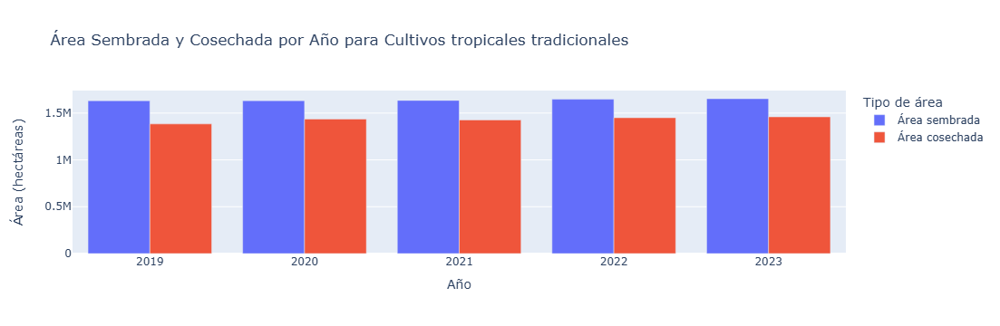

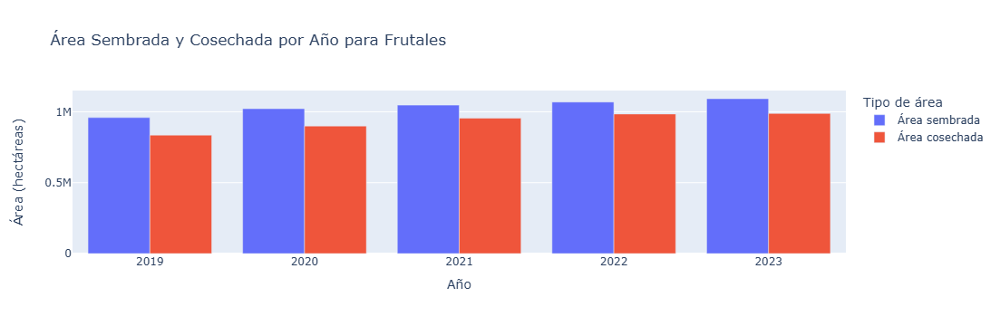

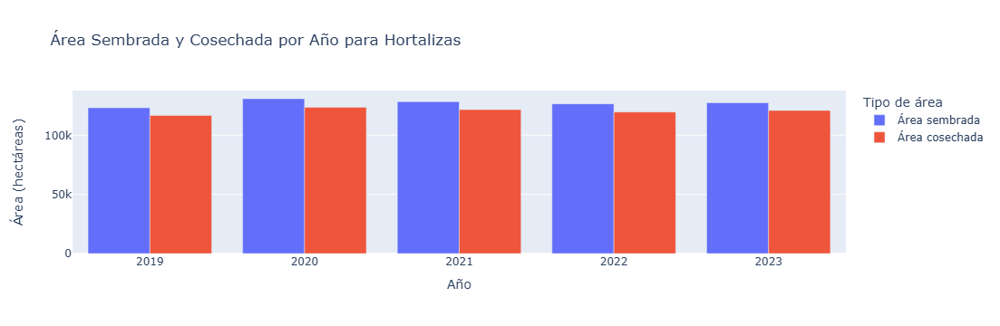

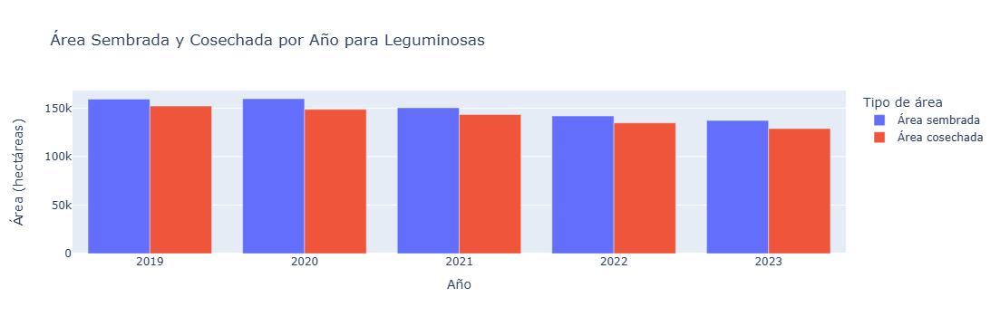

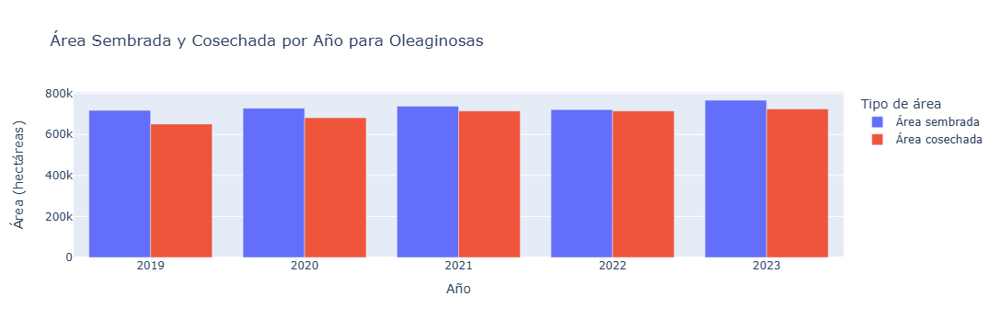

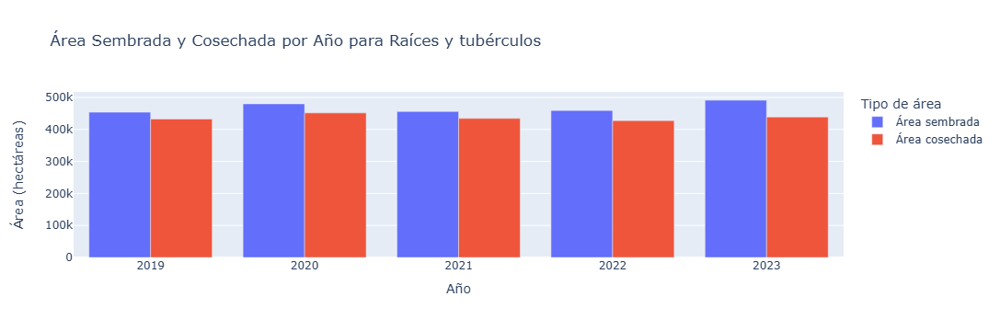

In [21]:
import plotly.express as px

# Agrupar los datos por Grupo cultivo y Año, sumando el Área sembrada y Área cosechada
datos_agregados = df.groupby(['Grupo cultivo', 'Año'])[['Área sembrada', 'Área cosechada']].sum().reset_index()

# Obtener la lista única de los grupos de cultivo
grupos_cultivo = datos_agregados['Grupo cultivo'].unique()

# Crear un gráfico para cada Grupo cultivo
for grupo in grupos_cultivo:
    # Filtrar datos para el grupo de cultivo actual
    datos_grupo = datos_agregados[datos_agregados['Grupo cultivo'] == grupo]

    # Crear gráfico de barras para el grupo de cultivo actual
    fig = px.bar(
        datos_grupo,
        x='Año',
        y=['Área sembrada', 'Área cosechada'],
        title=f'Área Sembrada y Cosechada por Año para {grupo}',
        labels={'value': 'Área (hectáreas)', 'variable': 'Tipo de área'},
        barmode='group'
    )

    # Mostrar el gráfico
    fig.show()


En estas gráficas de área sembrada y cosechada por año, para cada grupo cultivo es posible determinar que cada uno de estos presenta características y contextos diferentes, que los han llevado a trazar tendencias propias y que será útil estudiar desde un punto de vista más global, incluyendo patrones del clima, sociales y políticos

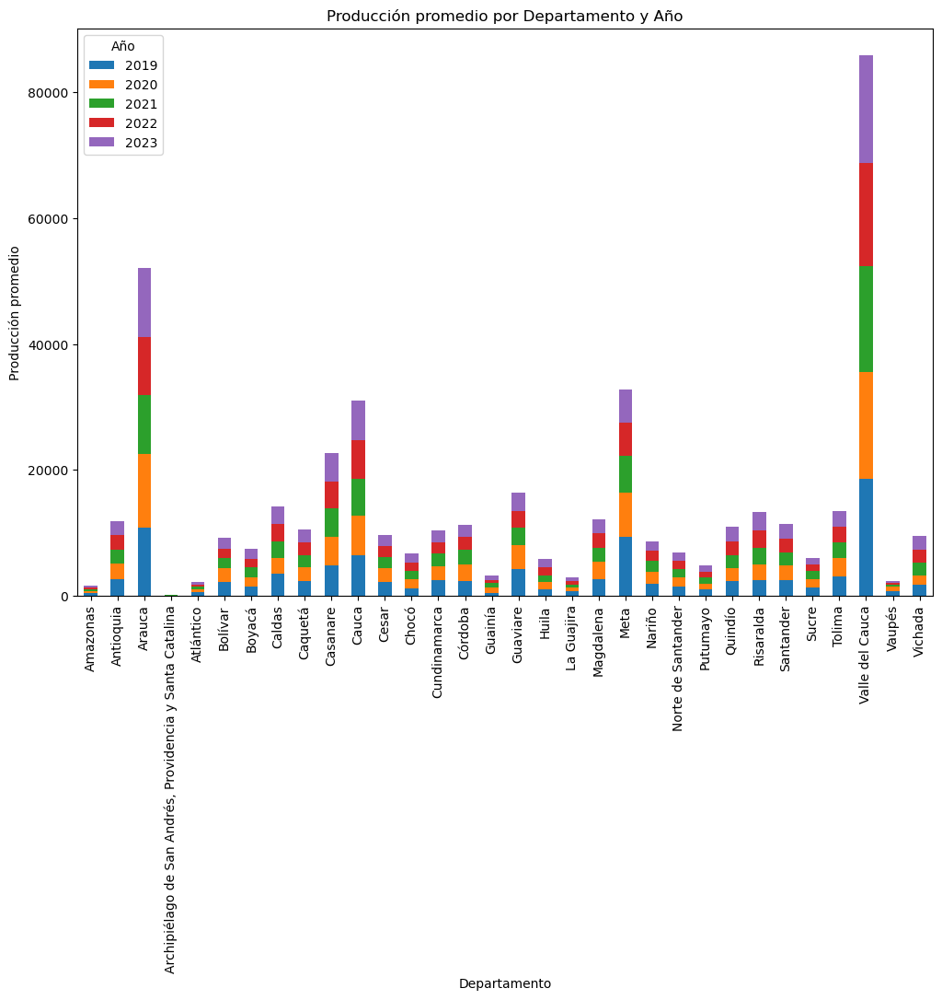

In [22]:
#promedio de producción por departamento y año
prod_por_depto = df.groupby(['Departamento', 'Año'])['Producción'].mean().unstack()
prod_por_depto.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.ylabel("Producción promedio")

#plt.xticks(rotation=60)
plt.title("Producción promedio por Departamento y Año")

plt.show()


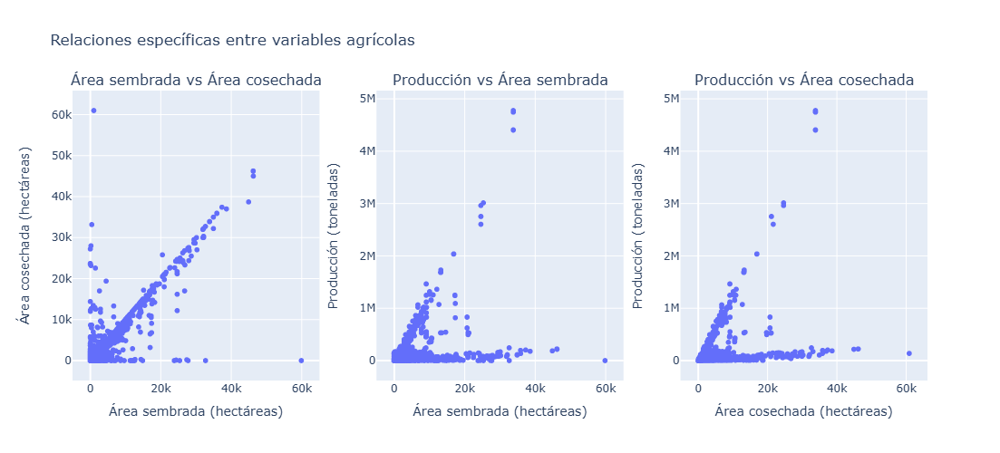

In [23]:
import plotly.express as px
import plotly.subplots as sp

# Crear una figura de subplots con 3 columnas para los gráficos individuales
fig = sp.make_subplots(rows=1, cols=3, subplot_titles=("Área sembrada vs Área cosechada",
                                                       "Producción vs Área sembrada",
                                                       "Producción vs Área cosechada"))

# Gráfico 1: Área sembrada vs Área cosechada
scatter1 = px.scatter(df, x='Área sembrada', y='Área cosechada', title="Área sembrada vs Área cosechada")
for trace in scatter1['data']:
    fig.add_trace(trace, row=1, col=1)
fig.update_xaxes(title_text="Área sembrada (hectáreas)", row=1, col=1)
fig.update_yaxes(title_text="Área cosechada (hectáreas)", row=1, col=1)

# Gráfico 2: Producción vs Área sembrada
scatter2 = px.scatter(df, x='Área sembrada', y='Producción', title="Producción vs Área sembrada")
for trace in scatter2['data']:
    fig.add_trace(trace, row=1, col=2)
fig.update_xaxes(title_text="Área sembrada (hectáreas)", row=1, col=2)
fig.update_yaxes(title_text="Producción (toneladas)", row=1, col=2)

# Gráfico 3: Producción vs Área cosechada
scatter3 = px.scatter(df, x='Área cosechada', y='Producción', title="Producción vs Área cosechada")
for trace in scatter3['data']:
    fig.add_trace(trace, row=1, col=3)
fig.update_xaxes(title_text="Área cosechada (hectáreas)", row=1, col=3)
fig.update_yaxes(title_text="Producción (toneladas)", row=1, col=3)

# Ajustar diseño
fig.update_layout(height=500, width=1200, title_text="Relaciones específicas entre variables agrícolas")
fig.show()
